In [1]:
from google.cloud import bigquery
import matplotlib.pyplot as plt
import networkx as nx
import os
import pandas as pd

GCP_PROJECT = 'opensource-observer'
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '../../../oso_gcp_credentials.json'
client = bigquery.Client(GCP_PROJECT)

In [2]:
query = """

-- Step 1: Identify relevant projects with sufficient activity
WITH relevant_projects AS (
    SELECT 
        project_id, 
        project_name,
        SUM(gas_fees_sum_6_months) AS gas_fees,
        SUM(transaction_count_6_months) AS txns,
        SUM(address_count_90_days) AS users
    FROM `oso.onchain_metrics_by_project_v1`
    WHERE event_source IN ('OPTIMISM', 'BASE', 'MODE', 'ZORA', 'FRAX', 'METAL')
    GROUP BY project_id, project_name
    HAVING txns > 1000 AND users > 420
),

-- Step 2: Fetch repositories related to the relevant projects
relevant_repos AS (
    SELECT 
        rm.artifact_id, 
        p.project_name, 
        p.project_id
    FROM `oso.int_repo_metrics_by_project` rm
    JOIN relevant_projects p ON rm.project_id = p.project_id
    WHERE rm.language IN ('TypeScript', 'Solidity', 'Rust')
),

-- Step 3: Identify core developers with significant contributions
core_devs AS (
    SELECT DISTINCT 
        from_artifact_id AS developer_id,
        from_artifact_name AS developer_name,
        to_artifact_id AS repo_id
    FROM `oso.int_events__github`
    WHERE to_artifact_id IN (SELECT artifact_id FROM relevant_repos)
      AND event_type = 'COMMIT_CODE'
      AND from_artifact_name NOT LIKE '%[bot]%'
      AND from_artifact_name != 'metamaskbot'
    GROUP BY developer_id, developer_name, repo_id
    HAVING COUNT(DISTINCT DATE_TRUNC(time, MONTH)) >= 3
       AND SUM(amount) >= 20
),

-- Step 4: Identify repositories that published releases
repos_with_releases AS (
    SELECT DISTINCT to_artifact_id 
    FROM `oso.int_events__github`
    WHERE event_type = 'RELEASE_PUBLISHED'
),

-- Step 5: Fetch interactions of core developers in other repositories
dev_other_repos AS (
    SELECT 
        cd.developer_id,
        cd.developer_name,
        rr.project_name AS source_project,
        rp.gas_fees AS source_project_gas_fees,
        rp.txns AS source_project_txns,
        rp.users AS source_project_users,
        e.to_artifact_namespace,
        e.to_artifact_name,
        target_p.project_name AS target_project_name,
        COUNT(DISTINCT DATE_TRUNC(e.time, DAY)) AS target_project_interaction_days_from_dev,
        SUM(e.amount) AS target_project_interaction_amount_from_dev,
        COUNT(DISTINCT e.event_type) AS target_project_interaction_types_distinct
    FROM core_devs cd
    JOIN relevant_repos rr ON cd.repo_id = rr.artifact_id
    JOIN relevant_projects rp ON rr.project_id = rp.project_id
    JOIN `oso.int_events__github` e ON cd.developer_id = e.from_artifact_id
    LEFT JOIN `oso.int_repo_metrics_by_project` target_rm ON e.to_artifact_id = target_rm.artifact_id
    LEFT JOIN `oso.projects_v1` target_p ON target_rm.project_id = target_p.project_id
    WHERE e.to_artifact_id NOT IN (SELECT artifact_id FROM relevant_repos)
      AND e.to_artifact_id IN (SELECT to_artifact_id FROM repos_with_releases)
      AND e.time >= '2023-01-01'
    GROUP BY 
        cd.developer_id, cd.developer_name, 
        rr.project_name, rp.gas_fees, rp.txns, rp.users, 
        e.to_artifact_namespace, e.to_artifact_name, target_project_name
    HAVING COUNT(DISTINCT DATE_TRUNC(e.time, DAY)) >= 1
)

-- Step 6: Select final results
SELECT * 
FROM dev_other_repos
WHERE source_project != target_project_name
ORDER BY target_project_interaction_days_from_dev DESC

"""

result = client.query(query)
df = result.to_dataframe()
df.head()

,developer_id,developer_name,source_project,source_project_gas_fees,source_project_txns,source_project_users,to_artifact_namespace,to_artifact_name,target_project_name,target_project_interaction_days_from_dev,target_project_interaction_amount_from_dev,target_project_interaction_types_distinct
0,heMxNRVMitNLEUyz6ZNbaef9yvu8M1WLv9AwdJcOK_c=,shoom3301,1-inch,50.480833,6121574.0,283335.0,cowprotocol,cowswap,cowprotocol,439,12794.0,11
1,a6Du3NiuSIkDr_EAJsES3SH6yUfu_yri4-LVDJ7QPYc=,fubuloubu,yearn,0.049135,10543.0,1558.0,apeworx,ape,apeworx,366,1436.0,9
2,cfax6VfyUWKV03_kgac_2RCcfEopCHyuIB8ECpP6uis=,jxom,rainbow,1.320583,272315.0,38962.0,wevm,viem,wevm,334,3246.0,11
3,P7BSl9bJIxFzs-nVfVZ288Wn-fovCX9_a4o6z95KBr0=,mds1,umbra-scopelift,0.004731,3399.0,638.0,foundry-rs,foundry,foundry,308,1058.0,8
4,P7BSl9bJIxFzs-nVfVZ288Wn-fovCX9_a4o6z95KBr0=,mds1,optimism,7.812239,1433067.0,280150.0,foundry-rs,foundry,foundry,308,1058.0,8


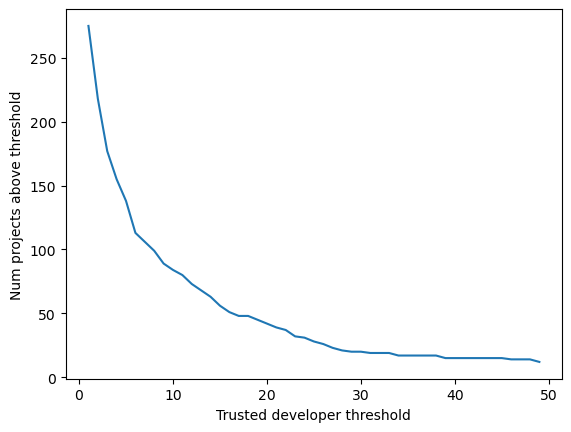

In [3]:
dev_counts = df.groupby('target_project_name')['developer_id'].nunique()
dev_counts = df.groupby('target_project_name')['developer_id'].nunique()
thresholds = range(1, 50)
num_projects = [sum(dev_counts > t) for t in thresholds]

plt.plot(thresholds, num_projects)
plt.ylabel('Num projects above threshold')
plt.xlabel('Trusted developer threshold')
plt.show()

In [4]:
top_projects = dev_counts[dev_counts>=10]
top_projects

target_project_name
0xsequence         16
alchemyplatform    21
alloy-rs           57
apeworx            27
base-org           25
                   ..
wighawag           15
worldcoin          16
zama-ai            15
zerodev            12
zkemail            13
Name: developer_id, Length: 89, dtype: int64

In [5]:
dff = df[df['target_project_name'].isin(top_projects.index)]
dff.to_csv('data/trusted_dev_graph.csv')

In [6]:
G = nx.Graph()
for (source, target), weight in (
    dff.groupby(['source_project', 'target_project_name'])
    ['developer_id']
    .nunique()
    .items()
):
    G.add_nodes_from([source, target])
    G.add_edge(source, target, weight=weight)

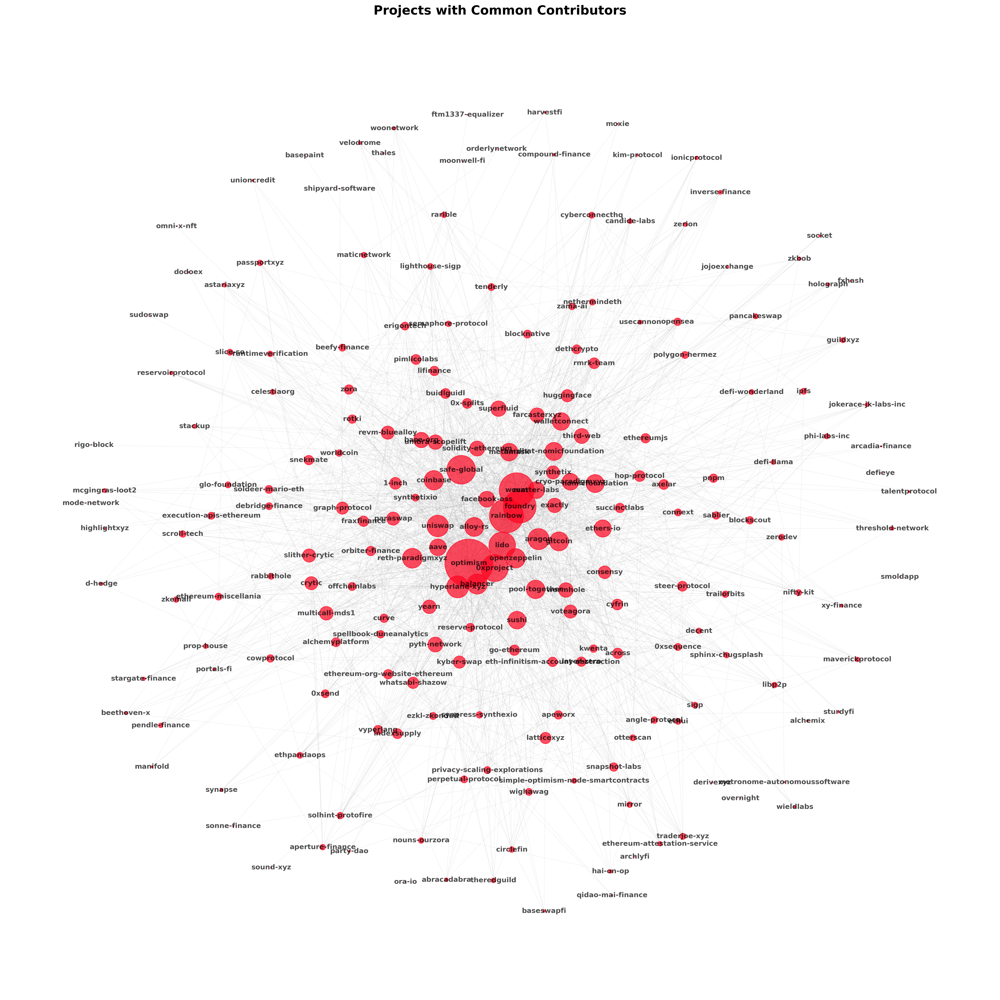

In [7]:
degrees = dict(G.degree)
scaled_node_size = [degrees[k] ** 1.8 for k in degrees]

pos = nx.spring_layout(G, scale=2, k=1, seed=42)

fig, ax = plt.subplots(figsize=(20, 20), dpi=300)
nx.draw(
    G, 
    pos, 
    nodelist=degrees, 
    node_size=scaled_node_size,
    node_color="#ff0420",
    edge_color="gray",
    width=0.1,
    with_labels=True,
    font_size=10,
    font_weight="bold",
    alpha=0.7,
    ax=ax
)

ax.set_title("Projects with Common Contributors", fontsize=18, fontweight="bold", pad=20)
ax.axis("off")

plt.tight_layout()
plt.show()